In [1]:
import pandas as pd

In [2]:
path_to_train_dataset = './data/help/train_ship_segmentations_v2.csv'

In [3]:
train = pd.read_csv(path_to_train_dataset)

In [4]:
train.describe

<bound method NDFrame.describe of               ImageId                                      EncodedPixels
0       00003e153.jpg                                                NaN
1       0001124c7.jpg                                                NaN
2       000155de5.jpg  264661 17 265429 33 266197 33 266965 33 267733...
3       000194a2d.jpg  360486 1 361252 4 362019 5 362785 8 363552 10 ...
4       000194a2d.jpg  51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...
...               ...                                                ...
231718  fffedbb6b.jpg                                                NaN
231719  ffff2aa57.jpg                                                NaN
231720  ffff6e525.jpg                                                NaN
231721  ffffc50b4.jpg                                                NaN
231722  ffffe97f3.jpg                                                NaN

[231723 rows x 2 columns]>

In [5]:
train['ImageId'].isna()

0         False
1         False
2         False
3         False
4         False
          ...  
231718    False
231719    False
231720    False
231721    False
231722    False
Name: ImageId, Length: 231723, dtype: bool

As a result we see there are no elements that doesn't contain imageId

Let's get the count of images with no ships

In [6]:
cnt_no_ships_s = train['EncodedPixels'].isna()
cnt_no_ships = cnt_no_ships_s.loc[lambda x: x == True].count()
cnt_no_ships

150000

Let's get the count of unique images with

In [7]:
cnt_ships = len(train['ImageId'].unique())
cnt_ships

192556

Let's find the percent of pictures with ship:

In [8]:
img_with_ships = cnt_ships - cnt_no_ships
ship_img_ratio = img_with_ships/cnt_ships
ship_img_ratio

0.2210058372629261

So only 22.1% of images contains at least one ship

In my point of view we don't need all amount of pictures for training. Because giving segmentation for such great amount pictures without ships should return just nothing. "A prediction of "no ship in image" should have a blank value in the EncodedPixels column."

So I will take all images with ships from training. And will take the same amount of pictures as with ships without ships.  

So I will process only about 44% of pictures. I need to convert run-length encodings for picture to mask. Then I have an idea to get segmentation using U-net model. And after that I want to convert mask to array of run-length endcodings using special packages. So now I will try to implement methods of converting to mask and method from mask to array of run-length endcodings to prove this concept

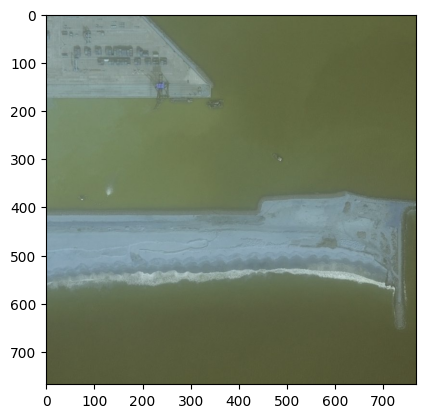

In [9]:
%matplotlib inline

import matplotlib.pyplot as plt
import cv2
img = cv2.imread('./data/train_v2/000194a2d.jpg')
plt.imshow(img)
plt.show()

In [10]:
image_rle = train[train['ImageId']=='000194a2d.jpg']['EncodedPixels']
image_rle

3    360486 1 361252 4 362019 5 362785 8 363552 10 ...
4    51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...
5    198320 10 199088 10 199856 10 200624 10 201392...
6    55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...
7    254389 9 255157 17 255925 17 256693 17 257461 ...
Name: EncodedPixels, dtype: object

In [11]:
len(image_rle)

5

In [12]:


img_shape = img.shape
img_shape

(768, 768, 3)

In [13]:
import numpy as np

In [14]:
def convert_rle_to_mask(rle,shape):
    res = np.zeros((shape[0],shape[1])).tolist()
    
    for i in range(len(rle)):
        encoded_pixels = rle.iloc[i]
        arr = encoded_pixels.split()
        for j in range(0,len(arr),2):
            cnt = int(arr[j+1])
            value = int(arr[j])
            for k in range(cnt):
                res[(value-1)//shape[0]][(value-1)%shape[0]] = 1
                value+=1
    return res
    

In [15]:
mask = convert_rle_to_mask(image_rle,img_shape)

In [16]:
mask

[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,

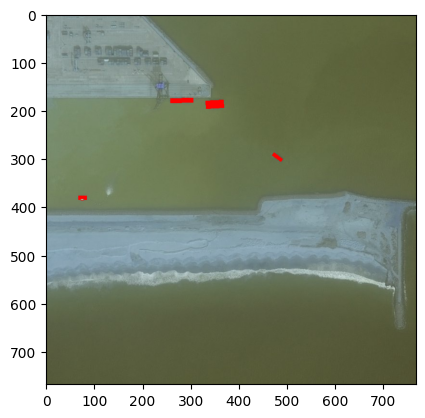

In [17]:
for i in range(len(mask)):
    for j in range(len(mask[0])):
        if (mask[i][j]==1):
            img[j,i] = (255,0,0)
plt.imshow(img)
plt.show()

In [61]:
from skimage import measure

def clusterize_objects(segmentation_mask):
    # Label connected components in the segmentation mask
    labeled_mask, num_objects = measure.label(segmentation_mask, connectivity=2, return_num=True)

    # Create an array to store information about each labeled object
    object_info = []

    # Iterate through each labeled object
    for obj_id in range(1, num_objects + 1):  # Start from 1 since 0 is background
        object_pixels = np.where(labeled_mask == obj_id)
        #print('HEllo')
        #print(object_pixels)
        object_bbox = (
            min(object_pixels[1]),
            min(object_pixels[0]),
            max(object_pixels[1]),
            max(object_pixels[0])
        )
        object_info.append({
            'id': obj_id,
            'bbox': object_bbox,
            'pixels': object_pixels
        })

    return object_info

In [62]:
clusters = clusterize_objects(np.array(mask))

In [71]:
def ship_box_to_rle(box,mask):
    startx = box[1]
    endx = box[3]
    stary = box[0]
    endy = box[2]
    res = ''
    cnt = 0
    pos = startx*len(mask)+stary+1
    endpos = endx*len(mask)+endy+1
    curpos = startx*len(mask)+stary+1
    while curpos<=endpos:
        x = curpos//len(mask)
        y = curpos%len(mask)
        if (mask[x][y]==1):
            cnt+=1
            if (cnt==1):
                pos = curpos
        else:
            if (cnt>0):
                if res=='':
                    res = str(pos)+' '+str(cnt)
                else:
                    res = res + ' '+str(pos)+' '+str(cnt)
            cnt = 0  
        curpos+=1
    if cnt>0:
        res = res + ' '+str(pos)+' '+str(cnt)
    return res
        

In [72]:
box1 = np.array(list(clusterize_objects(np.array(mask))[0]['bbox'])).tolist()

In [73]:
ship_box_to_rle(box1,mask)

'51834 8 52601 9 53369 9 54137 9 54905 9 55673 7 55682 1 56441 7 56450 1 57209 7 57218 1 57977 7 57986 1 58745 7 58754 1 59513 7 59522 1 60281 7 60290 1 61049 9 61817 9 62585 9 63353 9 64121 9 64889 9'

So, I proved my concept. After that: creation ml model and model inference

In [74]:
def create_rle_from_mask(mask):
    clusterize_objs = list(clusterize_objects(np.array(mask)))
    res = []
    for i in range(len (clusterize_objs)):
        res.append(ship_box_to_rle(np.array(clusterize_objs[i]['bbox']).tolist(),mask))
    return res

In [75]:
test = create_rle_from_mask(mask)

In [76]:
test

['51834 8 52601 9 53369 9 54137 9 54905 9 55673 7 55682 1 56441 7 56450 1 57209 7 57218 1 57977 7 57986 1 58745 7 58754 1 59513 7 59522 1 60281 7 60290 1 61049 9 61817 9 62585 9 63353 9 64121 9 64889 9',
 '198319 10 199087 10 199855 10 200623 10 201391 10 202159 10 202927 10 203695 10 204463 10 205231 10 205999 10 206767 10 207535 10 208303 10 209071 10 209839 10 210607 10 211375 10 212143 10 212911 10 213679 10 214447 10 215215 10 215983 10 216750 10 217518 10 218286 10 219054 10 219822 10 220590 10 221358 10 222126 10 222894 10 223662 10 224430 10 225198 10 225966 10 226734 10 227502 10 228270 10 229038 10 229806 10 230574 10 231342 10 232110 10 232878 10 233646 10 234414 10',
 '254388 9 255156 17 255924 17 256692 17 257460 17 258228 17 258996 17 259764 17 260532 17 261300 17 262067 18 262835 17 263603 17 264371 17 265139 17 265907 17 266675 17 267443 17 268211 17 268979 17 269747 17 270515 17 271283 17 272051 17 272819 17 273587 17 274355 17 275123 17 275890 18 276658 17 277426 17 2

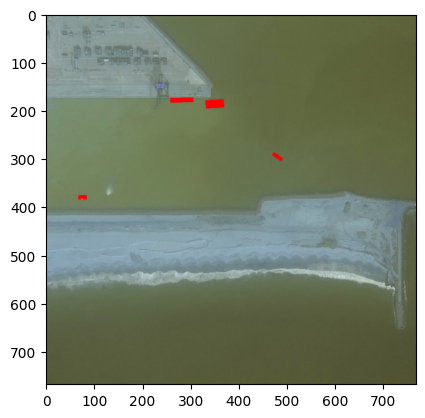

In [81]:
mask2 = convert_rle_to_mask(pd.Series(test),img_shape)
img = cv2.imread('./data/train_v2/000194a2d.jpg')

for i in range(len(mask)):
    for j in range(len(mask[0])):
        if (mask2[i][j]==1):
            img[j,i] = (255,0,0)
plt.imshow(img)
plt.show()

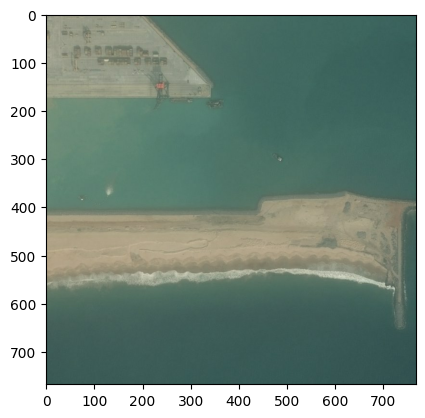

1/1 [==============================] - 1s 1s/step


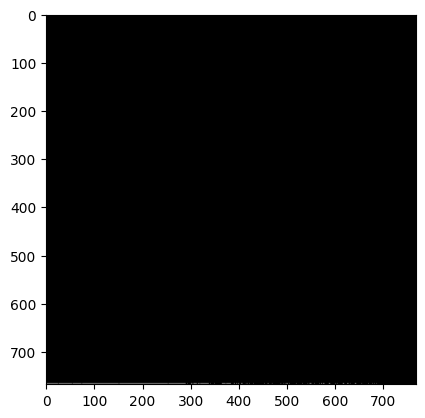

In [6]:


import matplotlib.pyplot as plt
import tensorflow as tf
import keras.backend as K
import numpy as np
from PIL import Image
import os
from skimage import measure

threshold = 0.5
def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.cast(K.flatten(y_true),'float32')
    y_pred_f = tf.cast(K.flatten(y_pred), 'float32')
    print(y_true_f.numpy())
    y_pred_f = tf.where(y_pred_f < threshold, 0.0, y_pred_f )
    y_pred_f = tf.where(y_pred_f >= threshold, 1.0, y_pred_f )
  
    intersection = K.sum(y_true_f * y_pred_f)
  
    dice = (2 * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return dice

@tf.function
def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def get_mask_as_image(mask):
    mask = mask.flatten().reshape(768,768).tolist()
    threshold = 0.5
    res = []
    for i in range(768):
        res.append([])
        for j in range(768):
            if (mask[i][j]>threshold):
                res[i].append(1)
               # print('yes')
            else:
                res[i].append(0)
    #print(res)
    mask_image = Image.fromarray(np.array(res).astype('uint8')*255)
    mask_image = mask_image.convert('RGB')
    return mask_image

def _parse_function_1(image_path):
    image_string = tf.io.read_file(image_path)
    image_decoded = tf.image.decode_jpeg(image_string, channels=3)
    #image_decoded = tf.image.resize(image_decoded, [128, 128])
    #image_decoded = tf.image.resize(image_decoded, [128, 128])
    image = tf.cast(image_decoded, tf.float32)/255.0
    #print(image)
    return np.expand_dims(image, axis=0)

def ship_box_to_rle(box,mask):
    startx = box[1]
    endx = box[3]
    stary = box[0]
    endy = box[2]
    res = ''
    cnt = 0
    pos = startx*len(mask)+stary+1
    endpos = endx*len(mask)+endy+1
    curpos = startx*len(mask)+stary+1
    while curpos<=endpos:
        x = curpos//len(mask)
        y = curpos%len(mask)
        if (mask[x][y]==1):
            cnt+=1
            if (cnt==1):
                pos = curpos
        else:
            if (cnt>0):
                if res=='':
                    res = str(pos)+' '+str(cnt)
                else:
                    res = res + ' '+str(pos)+' '+str(cnt)
            cnt = 0  
        curpos+=1
    if cnt>0:
        res = res + ' '+str(pos)+' '+str(cnt)
    return res
        
def clusterize_objects(segmentation_mask):
    # Label connected components in the segmentation mask
    labeled_mask, num_objects = measure.label(segmentation_mask, connectivity=2, return_num=True)

    # Create an array to store information about each labeled object
    object_info = []

    # Iterate through each labeled object
    for obj_id in range(1, num_objects + 1):  # Start from 1 since 0 is background
        object_pixels = np.where(labeled_mask == obj_id)
        #print('HEllo')
        #print(object_pixels)
        object_bbox = (
            min(object_pixels[1]),
            min(object_pixels[0]),
            max(object_pixels[1]),
            max(object_pixels[0])
        )
        object_info.append({
            'id': obj_id,
            'bbox': object_bbox,
            'pixels': object_pixels
        })

    return object_info

def create_rle_from_mask(mask):
    clusterize_objs = list(clusterize_objects(np.array(mask)))
    res = []
    for i in range(len (clusterize_objs)):
        res.append(ship_box_to_rle(np.array(clusterize_objs[i]['bbox']).tolist(),mask))
    return res


model = tf.keras.models.load_model('./model_dice_fix_bugs.hdf5',custom_objects={'dice_coef_loss': dice_coef_loss})
directory = './data/train_v2/000194a2d.jpg'

image = _parse_function_1(directory)
#print(model.output_shape)
#print(model.summary())
#print(image.shape)
plt.imshow(image[0])
plt.show()
f = directory
mask =  model.predict([_parse_function_1(f)])[0]
    #mask2 = model2.predict([_parse_function_2(f)])[0]
mask = get_mask_as_image(mask)
plt.imshow(mask)
plt.show()